<a href="https://colab.research.google.com/github/Ramiassaf/Student-Graduation-Prediction-Project/blob/main/StudentDATA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Presentation link: https://www.canva.com/design/DAFpwZUMgxk/8YlsqsR2Uzivum6uaV4FUw/edit?utm_content=DAFpwZUMgxk&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton

In [ ]:
!pip install dataprep # Install the dataprep library using pip



#Importing the needed Libararies



In [ ]:
import numpy as np
# for performing EDA
from dataprep.eda import plot
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing
from dataprep.datasets import load_dataset

# data processing
import pandas as pd

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid", color_codes=True)
sns.set(font_scale=1)

# Algorithms
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB


from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score,accuracy_score,f1_score
from sklearn.metrics import roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split
#metrics calculation
from sklearn import metrics

#Exploring The DATA

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/DATA/Student_academic.csv') # loading the data

In [ ]:
df.shape

(4424, 35)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 35 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance                      4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Nacionality                                     4424 non-null   int64  
 7   Mother's qualification                          4424 non-null   int64  
 8   Father's qualification                          4424 non-null   int64  
 9   Mother's occupation                      

In [ ]:
df.head(None)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,6,1,11,1,1,1,1,3,4,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,5,1,1,1,22,27,10,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,8,2,15,1,1,1,23,27,6,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,12,1,3,0,1,1,22,28,10,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4419,1,1,6,15,1,1,1,1,1,6,...,0,6,8,5,12.666667,0,15.5,2.8,-4.06,Graduate
4420,1,1,2,15,1,1,19,1,1,10,...,0,6,6,2,11.000000,0,11.1,0.6,2.02,Dropout
4421,1,1,1,12,1,1,1,22,27,10,...,0,8,9,1,13.500000,0,13.9,-0.3,0.79,Dropout
4422,1,1,1,9,1,1,1,22,27,8,...,0,5,6,5,12.000000,0,9.4,-0.8,-3.12,Graduate


In [ ]:
df.columns

Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance', 'Previous qualification', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Displaced',
       'Educational special needs', 'Debtor', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)

## **Stats and Insights**


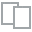
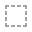
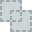
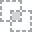
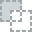
...
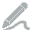
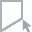
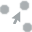
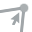
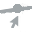

In [ ]:
plot(df)

## **Checking The null values**



In [ ]:
total = df.isnull().sum().sort_values(ascending=False)
percent_1 = df.isnull().sum()/df.isnull().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head(35)

,Total,%
Marital status,0,0.0
Curricular units 2nd sem (enrolled),0,0.0
Curricular units 1st sem (enrolled),0,0.0
Curricular units 1st sem (evaluations),0,0.0
Curricular units 1st sem (approved),0,0.0
Curricular units 1st sem (grade),0,0.0
Curricular units 1st sem (without evaluations),0,0.0
Curricular units 2nd sem (credited),0,0.0
Curricular units 2nd sem (evaluations),0,0.0
International,0,0.0


### **Counting The Target values**

In [ ]:
df.Target.value_counts()

Graduate    2209
Dropout     1421
Enrolled     794
Name: Target, dtype: int64

To focus on training the algorithm for predicting student graduation, I will exclude the 'enrolled' values from the dataset initially. The training will be conducted using only the 'graduate' and 'dropout' target variables. Once the algorithm is trained, I will then use it to predict whether a student will graduate or not, including the 'enrolled' values in the prediction phase.

In [ ]:
#'Target' is the name of the column I want to filter
# 'Enrolled' is the value in the 'Target' column to be filtered

# Step 1: Filter rows where 'Target' is 'Enrolled' and store them in 'new_enrolled'
new_enrolled = df[df['Target'] == 'Enrolled'].copy()

# Step 2: Remove the 'Enrolled' rows from the original DataFrame and store the result back in 'df'
df = df[df['Target'] != 'Enrolled'].copy()

# 'new_enrolled' contains all the rows where 'Target' is 'Enrolled' (794 rows, 35 columns)
# 'df' no longer contains those rows (remaining rows: 4424 - 794 = 3629 rows, 35 columns)


In [ ]:
print(new_enrolled.shape)
df.shape

(794, 35)


(3630, 35)

In [ ]:
new_enrolled.head()


,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
16,1,9,1,10,1,1,1,13,28,6,...,0,6,14,2,11.000,0,10.8,1.4,1.74,Enrolled
19,1,1,1,16,1,1,1,13,14,8,...,0,7,8,6,13.500,0,16.2,0.3,-0.92,Enrolled
21,1,9,4,13,1,1,1,1,28,5,...,0,8,9,8,11.425,0,12.7,3.7,-1.70,Enrolled
25,1,1,1,10,1,1,1,13,28,10,...,0,6,12,4,11.000,0,7.6,2.6,0.32,Enrolled
27,1,1,1,6,1,1,1,13,14,4,...,0,5,7,4,13.000,0,9.4,-0.8,-3.12,Enrolled


## **Data Visualization and Correlation**

> The data analysis from the graphs and heat maps reveals that certain features strongly influence our target variable, "Curricular units 2nd sem (approved)" and "Curricular units 2nd sem (grade)." Notably, the number of curricular units approved in both the first and second semesters, along with the corresponding grades, significantly impact student success. Early success in the first semester can set a positive trajectory for overall achievement. Additionally, students who keep their tuition fees up to date and those who are scholarship holders tend to perform better academically. Understanding the influence of these key features allows us to identify factors contributing to student success and facilitates the development of strategies to improve academic outcomes effectively.




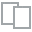
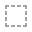
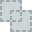
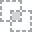
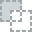
...
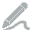
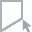
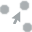
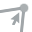
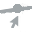

In [ ]:
le = LabelEncoder()
df['Target'] = le.fit_transform(df['Target'])
plot_correlation(df, "Target")

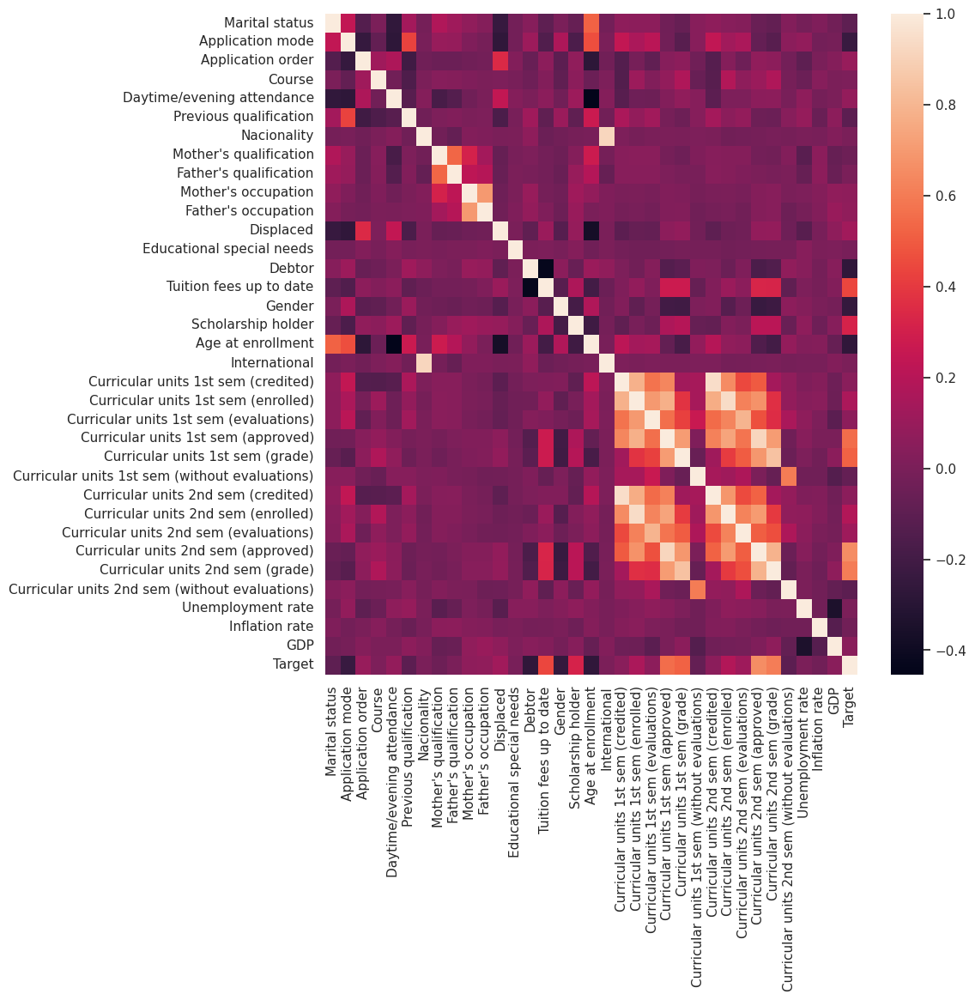

In [ ]:
# Create the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(df.corr())

# Show the heatmap
plt.show()


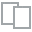
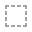
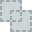
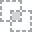
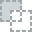
...
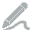
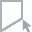
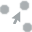
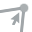
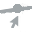

In [ ]:
from dataprep.eda import plot_correlation
plot_correlation(df, "Target", value_range=[0.3, 1])

Below, we are visualizing the relationship between the highly correlated
features and our target variable using scatter plots. By creating scatter plots, we can visually assess the correlation and understand how changes in these features relate to changes in the target variable. This exploration enables us to gain valuable insights into the nature and strength of the relationships, ultimately aiding in making informed decisions and predictions based on the data.

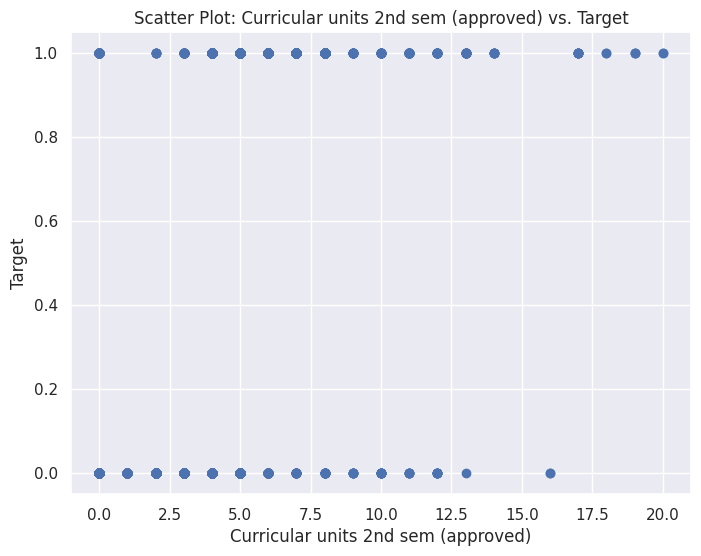

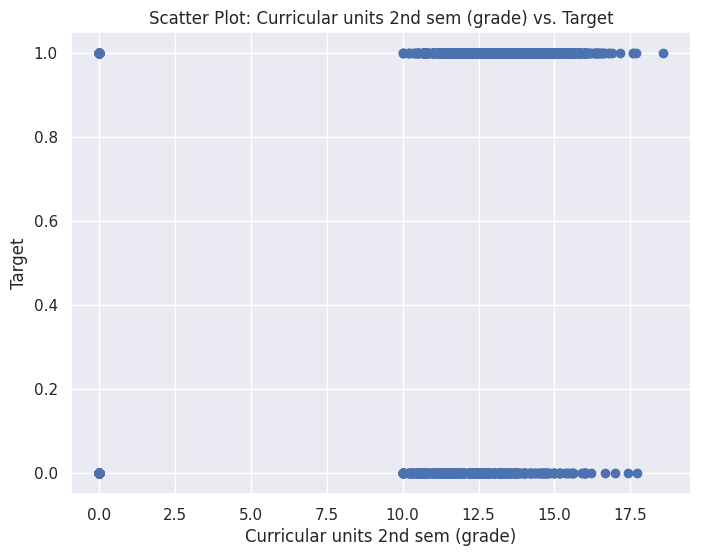

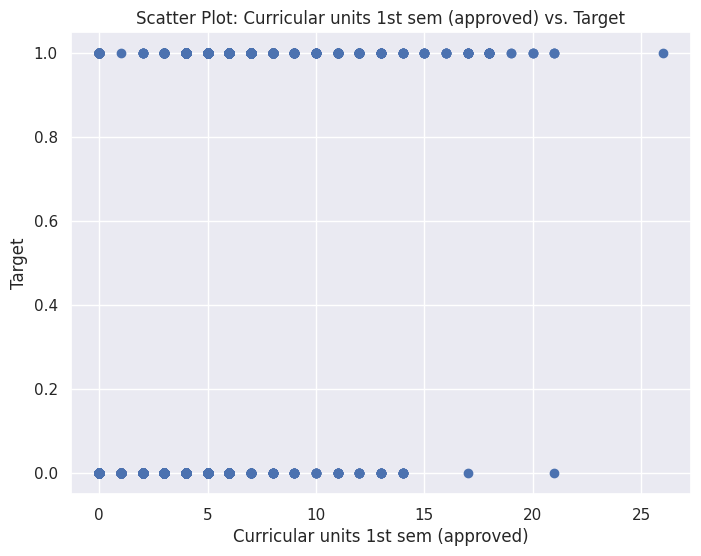

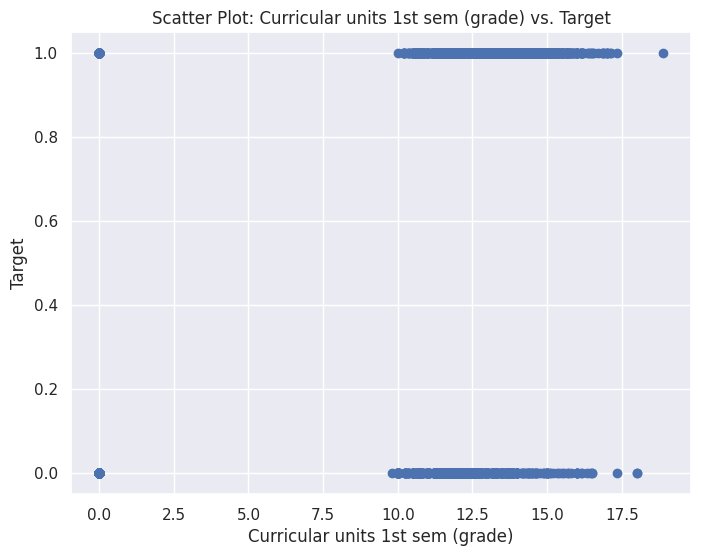

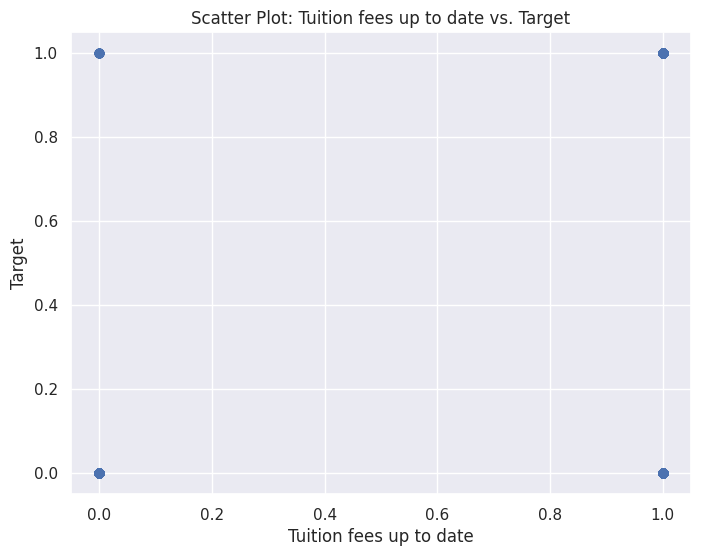

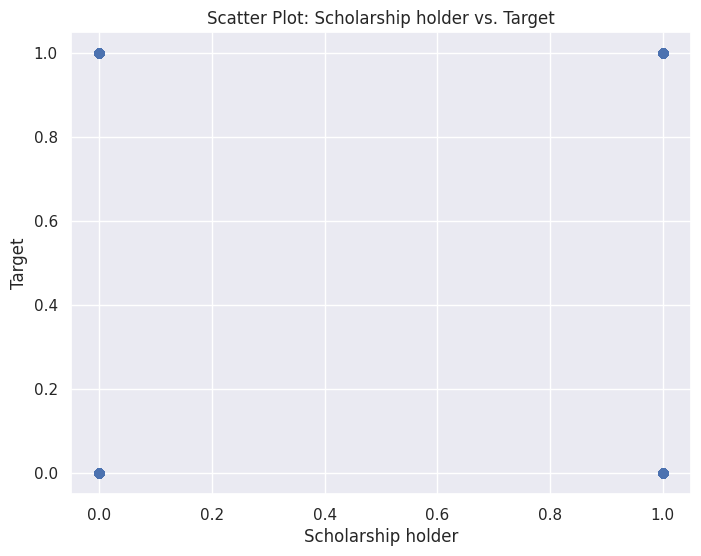

In [ ]:
features = ['Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Tuition fees up to date', 'Scholarship holder']

for feature in features:
    plt.figure(figsize=(8, 6))
    plt.scatter(df[feature], df['Target'])
    plt.xlabel(feature)
    plt.ylabel('Target')
    plt.title(f'Scatter Plot: {feature} vs. Target')
    plt.show()

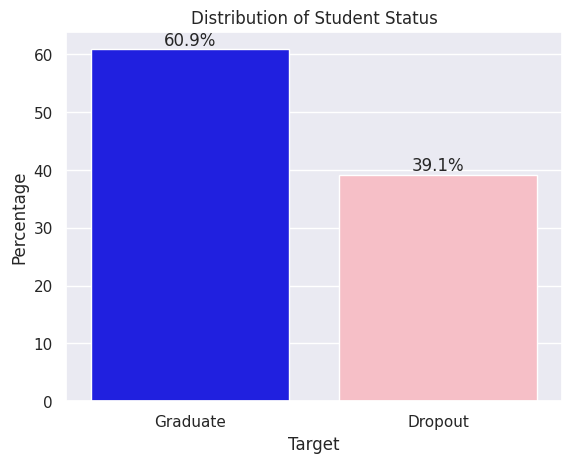

In [ ]:
# Map target values to labels for the legend
target_labels = {0: "Dropout", 1: "Graduate"}
df["Target_Labels"] = df["Target"].map(target_labels)

# Calculate percentages for each category in the "Target" column
total_samples = len(df)
target_percentages = df["Target"].value_counts() / total_samples * 100

# Define custom colors for the categories
custom_colors = ["blue", "lightpink"]

# Create a bar plot with the percentages displayed on top
ax = sns.barplot(data=df, x=target_percentages.index, y=target_percentages, palette=custom_colors)

# Add percentages on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height, f"{height:.1f}%", ha="center", va="bottom")

# Add a title and labels to the axes
plt.title("Distribution of Student Status")
plt.xlabel("Target")
plt.ylabel("Percentage")

# Show the plot
plt.show()


In [ ]:
import plotly.express as px

# Calculate the value counts for each category in the "Target" column
target_counts = df['Target'].value_counts()

# Create a pie chart
fig = px.pie(
    values=target_counts,
    names=target_counts.index,
    custom_data=[target_counts.index],
    labels=target_counts.index,  # Use the original values as names
)

# Set custom colors for the segments
custom_colors = ["Midtblue", "lightpink"]
fig.update_traces(marker=dict(colors=custom_colors))

# Update the hover template to display the custom labels and percentages
fig.update_traces(
    hovertemplate="%{label}: %{percent:.1%} <br> Category: %{customdata[0]}"
)

# Update the layout to add a title and center it
fig.update_layout(
    title={
        'text': "Proportion of Students by Target Category",
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Show the plot
fig.show()


/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:137: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

/usr/local/lib/python3.10/dist-packages/pandas/core/indexes/base.py:5339: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:137: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



## **Label Encoding**
  Label encoding is a crucial preprocessing step in machine learning when dealing with categorical data. In many machine learning algorithms, features must be represented numerically for the model to process the data effectively. Label encoding is a technique that assigns unique integers to different categories or labels within a categorical feature. This process allows the model to understand the ordinal relationship between the categories and ensures that the numerical representation reflects their relative importance or order.








In [ ]:
#converting categorical into numerical
labelencoder = LabelEncoder()
df['Target'] = labelencoder.fit_transform(df['Target'])
df.head()


,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,Target_Labels
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0.000000,0,10.8,1.4,1.74,0,NaN
1,1,6,1,11,1,1,1,1,3,4,...,6,6,6,13.666667,0,13.9,-0.3,0.79,1,NaN
2,1,1,5,5,1,1,1,22,27,10,...,6,0,0,0.000000,0,10.8,1.4,1.74,0,NaN
3,1,8,2,15,1,1,1,23,27,6,...,6,10,5,12.400000,0,9.4,-0.8,-3.12,1,NaN
4,2,12,1,3,0,1,1,22,28,10,...,6,6,6,13.000000,0,13.9,-0.3,0.79,1,NaN


In [ ]:
df.Target.unique() # 0 Dropout 1  Graduated

array([0, 1])

In [ ]:
#converting categorical into numerical
labelencoder = LabelEncoder()
new_enrolled['Target'] = labelencoder.fit_transform(new_enrolled['Target'])
new_enrolled.head()


,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
16,1,9,1,10,1,1,1,13,28,6,...,0,6,14,2,11.000,0,10.8,1.4,1.74,0
19,1,1,1,16,1,1,1,13,14,8,...,0,7,8,6,13.500,0,16.2,0.3,-0.92,0
21,1,9,4,13,1,1,1,1,28,5,...,0,8,9,8,11.425,0,12.7,3.7,-1.70,0
25,1,1,1,10,1,1,1,13,28,10,...,0,6,12,4,11.000,0,7.6,2.6,0.32,0
27,1,1,1,6,1,1,1,13,14,4,...,0,5,7,4,13.000,0,9.4,-0.8,-3.12,0


## **Normalization of the Data Set**

> Normalizing a dataset is a fundamental preprocessing step in machine learning that brings all features to a common scale. The process of normalization ensures that each feature contributes equally to the learning process and prevents one feature from dominating the others due to its larger magnitude.



In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

new_ar= scaler.fit_transform(df)
df= pd.DataFrame(new_ar, columns=df.columns)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_data.py:473: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_data.py:474: RuntimeWarning:

All-NaN slice encountered



In [ ]:
new_ar_en= scaler.fit_transform(new_enrolled)
enrolled_NOW= pd.DataFrame(new_ar_en, columns=new_enrolled.columns)

In [ ]:
enrolled_NOW.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,0.0,0.5,0.000,0.5625,1.0,0.0,0.0,0.444444,0.900000,0.161290,...,0.0,0.352941,0.500000,0.166667,0.625000,0.0,0.372093,0.488889,0.766182,0.0
1,0.0,0.0,0.000,0.9375,1.0,0.0,0.0,0.444444,0.433333,0.225806,...,0.0,0.411765,0.285714,0.500000,0.767045,0.0,1.000000,0.244444,0.414795,0.0
2,0.0,0.5,0.375,0.7500,1.0,0.0,0.0,0.000000,0.900000,0.129032,...,0.0,0.470588,0.321429,0.666667,0.649148,0.0,0.593023,1.000000,0.311757,0.0
3,0.0,0.0,0.000,0.5625,1.0,0.0,0.0,0.444444,0.900000,0.290323,...,0.0,0.352941,0.428571,0.333333,0.625000,0.0,0.000000,0.755556,0.578600,0.0
4,0.0,0.0,0.000,0.3125,1.0,0.0,0.0,0.444444,0.433333,0.096774,...,0.0,0.294118,0.250000,0.333333,0.738636,0.0,0.209302,0.000000,0.124174,0.0


# **Checking** **and Removing Outliers**

> utlier is an observation that significantly deviates from the majority of other data points. It is a data point that lies far away from the central tendency of the data, either much larger or much smaller than the typical values in the dataset. Outliers can be caused by various factors, such as measurement errors, data entry mistakes, or unusual events.



[Text(0, 0, 'Marital status'),
 Text(1, 0, 'Application mode'),
 Text(2, 0, 'Application order'),
 Text(3, 0, 'Course'),
 Text(4, 0, 'Daytime/evening attendance'),
 Text(5, 0, 'Previous qualification'),
 Text(6, 0, 'Nacionality'),
 Text(7, 0, "Mother's qualification"),
 Text(8, 0, "Father's qualification"),
 Text(9, 0, "Mother's occupation"),
 Text(10, 0, "Father's occupation"),
 Text(11, 0, 'Displaced'),
 Text(12, 0, 'Educational special needs'),
 Text(13, 0, 'Debtor'),
 Text(14, 0, 'Tuition fees up to date'),
 Text(15, 0, 'Gender'),
 Text(16, 0, 'Scholarship holder'),
 Text(17, 0, 'Age at enrollment'),
 Text(18, 0, 'International'),
 Text(19, 0, 'Curricular units 1st sem (credited)'),
 Text(20, 0, 'Curricular units 1st sem (enrolled)'),
 Text(21, 0, 'Curricular units 1st sem (evaluations)'),
 Text(22, 0, 'Curricular units 1st sem (approved)'),
 Text(23, 0, 'Curricular units 1st sem (grade)'),
 Text(24, 0, 'Curricular units 1st sem (without evaluations)'),
 Text(25, 0, 'Curricular uni

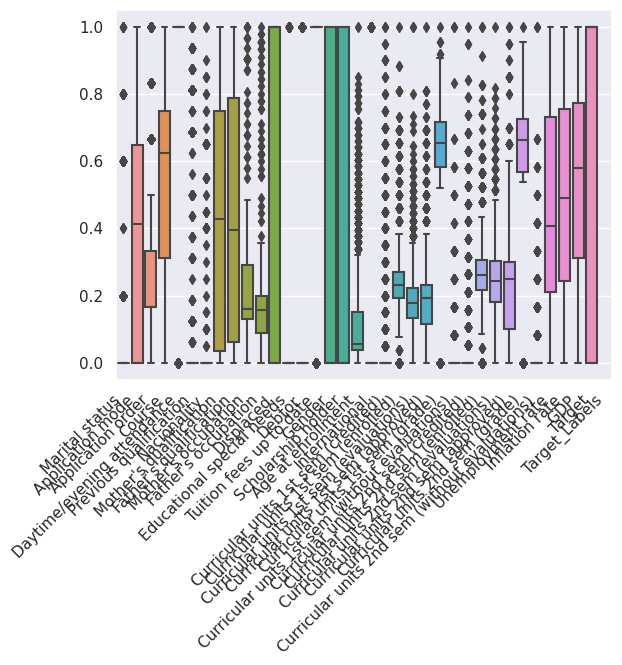

In [ ]:
g = sns.boxplot(df)
# Increase the spacing between the x-axis labels
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha="right")

Marital status                                    0.000000
Application mode                                  0.647059
Application order                                 0.166667
Course                                            0.437500
Daytime/evening attendance                        0.000000
Previous qualification                            0.000000
Nacionality                                       0.000000
Mother's qualification                            0.714286
Father's qualification                            0.727273
Mother's occupation                               0.161290
Father's occupation                               0.111111
Displaced                                         1.000000
Educational special needs                         0.000000
Debtor                                            0.000000
Tuition fees up to date                           0.000000
Gender                                            1.000000
Scholarship holder                                1.0000

[Text(0, 0, 'Marital status'),
 Text(1, 0, 'Application mode'),
 Text(2, 0, 'Application order'),
 Text(3, 0, 'Course'),
 Text(4, 0, 'Daytime/evening attendance'),
 Text(5, 0, 'Previous qualification'),
 Text(6, 0, 'Nacionality'),
 Text(7, 0, "Mother's qualification"),
 Text(8, 0, "Father's qualification"),
 Text(9, 0, "Mother's occupation"),
 Text(10, 0, "Father's occupation"),
 Text(11, 0, 'Displaced'),
 Text(12, 0, 'Educational special needs'),
 Text(13, 0, 'Debtor'),
 Text(14, 0, 'Tuition fees up to date'),
 Text(15, 0, 'Gender'),
 Text(16, 0, 'Scholarship holder'),
 Text(17, 0, 'Age at enrollment'),
 Text(18, 0, 'International'),
 Text(19, 0, 'Curricular units 1st sem (credited)'),
 Text(20, 0, 'Curricular units 1st sem (enrolled)'),
 Text(21, 0, 'Curricular units 1st sem (evaluations)'),
 Text(22, 0, 'Curricular units 1st sem (approved)'),
 Text(23, 0, 'Curricular units 1st sem (grade)'),
 Text(24, 0, 'Curricular units 1st sem (without evaluations)'),
 Text(25, 0, 'Curricular uni

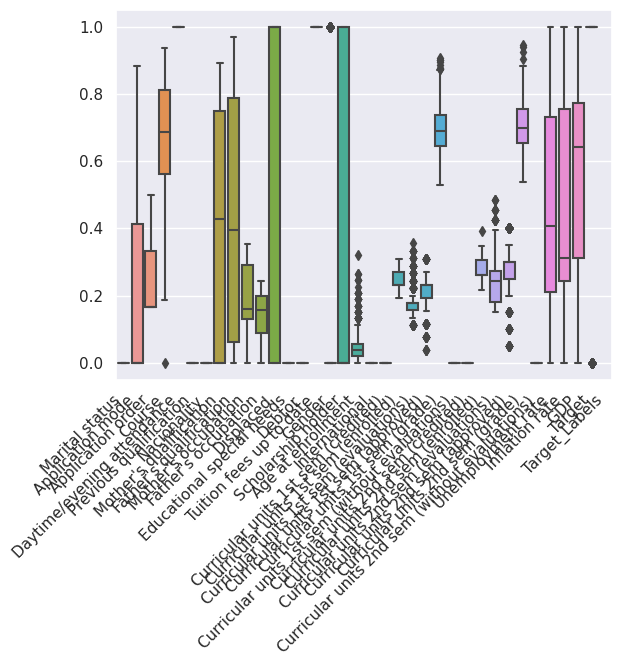

In [ ]:
q1=df.quantile(0.25)
q3=df.quantile(0.75)
iqr=q3-q1
print(iqr)
df = df[~((df < (q1 - 1.5 * iqr)) |(df > (q3 + 1.5 * iqr))).any(axis=1)]
g =sns.boxplot(df)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha="right")

In [ ]:
df.shape

(1229, 36)

## **Spliting the Data to Train and Test**

In [ ]:
X_features=df.values[:,0:33]
y_label= df.values[:,34]
#Split the data into 80/20
X_train,X_test,y_train,y_test=train_test_split(X_features,y_label,test_size=0.2,random_state=0)

Since we still have outlirs we will use  robust Scaller to normalize and standarize the data

> robust scaler is a statistical method that is used to scale data in a way that is resistant to outliers.used in machine learning because they can help to improve the performance of machine learning models. Models that are trained on data with outliers are more likely to be overfit to the outliers, which can lead to poor performance on new data.



In [ ]:
from sklearn.preprocessing import RobustScaler
rob_scaler = RobustScaler()
X_train = rob_scaler.fit_transform(X_train)
X_test = rob_scaler.fit_transform(X_test)
X_enrolled_NOW=rob_scaler.fit_transform(enrolled_NOW.values[:,0:33])

## **Commulative Variance**
https://www.dataknowsall.com/pcavisualized.html#:~:text=Explained%20Variance%20Cumulative%20Plot%3A%20This,up%20to%20the%20total%20variance.

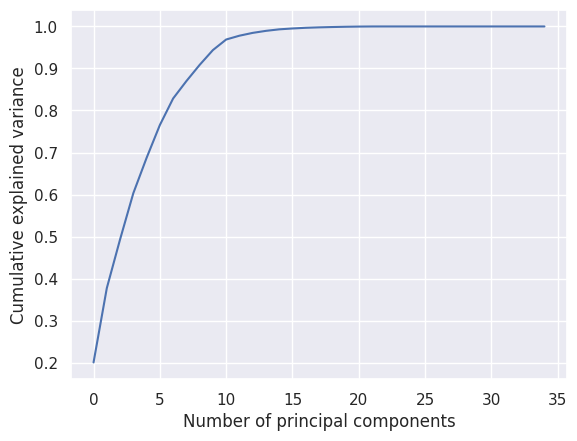

In [ ]:
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import numpy as np

# Extract numerical columns
data = df.select_dtypes(include=[np.number])

# Impute missing values with the mean
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(data)

# Create a PCA model
pca = PCA()
pca.fit(data_imputed)

# Calculate the cumulative explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Create a plot
plt.plot(explained_variance)
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.show()


### **Applying PCA**


In [ ]:
#apply pca
pca=PCA(n_components=15)
pcaxtrain=pca.fit_transform(X_train)
pcaxtest=pca.fit_transform(X_test)
X_enrolled_pca=pca.fit_transform(X_enrolled_NOW)
pca.n_components_

15

## **Random Forest Algorithm**

> creating first ML model which is Random forest we can see the two classes 0 and 1 . checking the accuracy with training data used and then comparing it to the accuracy with testing data used



In [ ]:
#hyperparameters n_estimator with 90,100 ,random_state starting with 0 to 100
from sklearn.ensemble import RandomForestClassifier
random_forest = RandomForestClassifier(n_estimators=100 ,random_state=0)
random_forest.fit(pcaxtrain, y_train)
Y_prediction = random_forest.predict(pcaxtrain )
print(random_forest.classes_)
acc_random_forest = round(random_forest.score(pcaxtrain, y_train) * 100, 2)
print('Accuracy using Training data',acc_random_forest)
Y_predictionts = random_forest.predict(pcaxtest )
acc_random_forestts = round(random_forest.score(pcaxtest, y_test) * 100, 2)
print('Accuracy using Testing data',acc_random_forestts)

[0. 1.]
Accuracy using Training data 100.0
Accuracy using Testing data 88.21


### **Confusion** **Matrix**

In [ ]:
confusion_matrix(y_train, Y_prediction)

array([[130,   0],
       [  0, 853]])

In [ ]:
confusion_matrix(y_test, Y_predictionts)



array([[  7,  26],
       [  3, 210]])

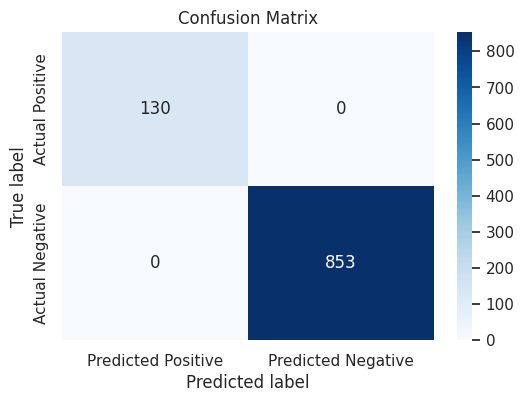

In [ ]:
confusion_matrix = np.array([[130, 0],
                            [0, 853]])
# Create a heatmap using seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Predicted Positive", "Predicted Negative"],
            yticklabels=["Actual Positive", "Actual Negative"])

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print(metrics.classification_report(y_train, Y_prediction, digits=3))

              precision    recall  f1-score   support

         0.0      1.000     1.000     1.000       130
         1.0      1.000     1.000     1.000       853

    accuracy                          1.000       983
   macro avg      1.000     1.000     1.000       983
weighted avg      1.000     1.000     1.000       983



In [ ]:
print(metrics.classification_report(y_test, Y_predictionts, digits=3))

              precision    recall  f1-score   support

         0.0      0.700     0.212     0.326        33
         1.0      0.890     0.986     0.935       213

    accuracy                          0.882       246
   macro avg      0.795     0.599     0.630       246
weighted avg      0.864     0.882     0.854       246



## **Logistic Regression Algorithm**



In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

classifier2 = LogisticRegression(random_state=0)
classifier2.fit(pcaxtrain, y_train)
print(classifier2.classes_)

predictTrain = classifier2.predict(pcaxtrain)
predict = classifier2.predict(pcaxtest)

cm_train = confusion_matrix(y_train, predictTrain)
print("Confusion Matrix - Training Set:")
print(cm_train)

cm_test = confusion_matrix(y_test, predict)
print("Confusion Matrix - Test Set:")
print(cm_test)


[0. 1.]
Confusion Matrix - Training Set:
[[ 63  67]
 [ 10 843]]
Confusion Matrix - Test Set:
[[  7  26]
 [  9 204]]


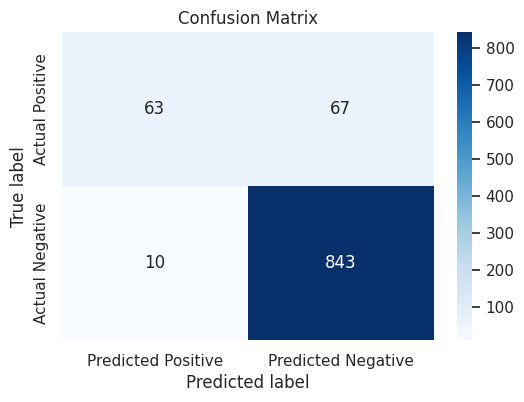

In [ ]:
confusion_matrix = np.array([[63, 67],
                            [10, 843]])
# Create a heatmap using seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Predicted Positive", "Predicted Negative"],
            yticklabels=["Actual Positive", "Actual Negative"])

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
acc_LR= round(classifier2.score(pcaxtrain, y_train) * 100, 2)
print('Accuracy using Training data',acc_LR)
acc_LR2 = round(classifier2.score(pcaxtest, y_test) * 100, 2)
print('Accuracy using Testing data',acc_LR2)

Accuracy using Training data 92.17
Accuracy using Testing data 85.77


In [ ]:
print(metrics.classification_report(y_train, predictTrain, digits=3))


              precision    recall  f1-score   support

         0.0      0.863     0.485     0.621       130
         1.0      0.926     0.988     0.956       853

    accuracy                          0.922       983
   macro avg      0.895     0.736     0.789       983
weighted avg      0.918     0.922     0.912       983



## **Gaussian Naive bayes ML model**

In [ ]:
gaussian = GaussianNB()
gaussian.fit(pcaxtrain, y_train)
Y_pred = gaussian.predict(pcaxtrain)
acc_gaussian = round(gaussian.score(pcaxtrain, y_train) * 100, 2)
acc_gaussian1 = round(gaussian.score(pcaxtest, y_test) * 100, 2)
print('Accuracy train',acc_gaussian)
print('Accuracy test',acc_gaussian1)

Accuracy train 89.83
Accuracy test 86.59


In [ ]:
from sklearn.metrics import confusion_matrix
Gpredictions = gaussian.predict(pcaxtrain)
confusion_matrix(y_train,Gpredictions)

array([[ 70,  60],
       [ 40, 813]])

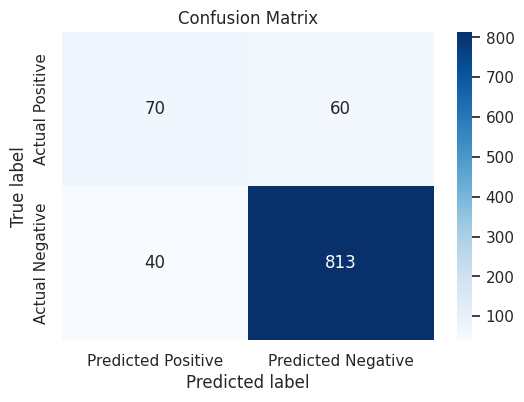

In [ ]:
confusion_matrix = np.array([[70, 60],
                            [40, 813]])
# Create a heatmap using seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Predicted Positive", "Predicted Negative"],
            yticklabels=["Actual Positive", "Actual Negative"])

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print(metrics.classification_report(y_train, Gpredictions, digits=3))

              precision    recall  f1-score   support

         0.0      0.636     0.538     0.583       130
         1.0      0.931     0.953     0.942       853

    accuracy                          0.898       983
   macro avg      0.784     0.746     0.763       983
weighted avg      0.892     0.898     0.895       983



 creating Decision Tree ML Model
we see that accuracy for training data is 100
and for testing data it is 82.11

and printing the confusion matrix and report

## **Decision Tree Algorithm**

In [ ]:
decisiontree=DecisionTreeClassifier()
decisiontree.fit(pcaxtrain,y_train)
Y_predDT=decisiontree.predict(pcaxtrain)
acc_dt1=round(decisiontree.score(pcaxtrain, y_train) * 100, 2)
Y_predDT2=decisiontree.predict(pcaxtest)
acc_dt2=round(decisiontree.score(pcaxtest, y_test) * 100, 2)
print('Accuracy using Training data',acc_dt1)
print('Accuracy using Testing data',acc_dt2)

Accuracy using Training data 100.0
Accuracy using Testing data 82.52


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_train, Y_predDT)

array([[130,   0],
       [  0, 853]])

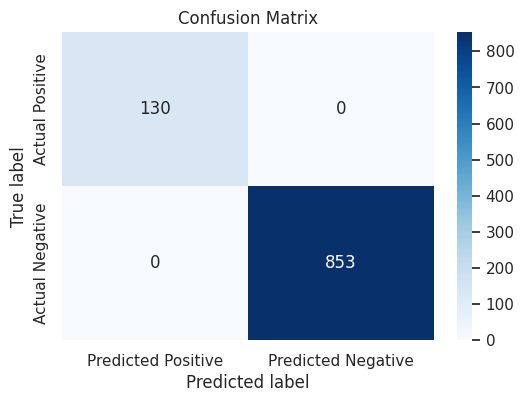

In [ ]:
confusion_matrix = np.array([[130, 0],
                            [0, 853]])
# Create a heatmap using seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Predicted Positive", "Predicted Negative"],
            yticklabels=["Actual Positive", "Actual Negative"])

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print(metrics.classification_report(y_train, Y_predDT, digits=3))

              precision    recall  f1-score   support

         0.0      1.000     1.000     1.000       130
         1.0      1.000     1.000     1.000       853

    accuracy                          1.000       983
   macro avg      1.000     1.000     1.000       983
weighted avg      1.000     1.000     1.000       983



## **SVC Algorithm**

> creating Linear support vector ML Model with maximum iteration 10000 and we see the accuracy is 92.17

I printed also the confusion matrix and the classification metrics report




In [ ]:
svc=LinearSVC(dual=False , max_iter=10000)
svc.fit(pcaxtrain,y_train)
Y_predSVC=svc.predict(pcaxtrain)
acc_svc=round(svc.score(pcaxtrain, y_train) * 100, 2)
acc_svc1=round(svc.score(pcaxtest, y_test) * 100, 2)
print('Accuracy train',acc_svc)
print('Accuracy test',acc_svc1)

Accuracy train 92.17
Accuracy test 85.77


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_train, Y_predSVC)

array([[ 60,  70],
       [  7, 846]])

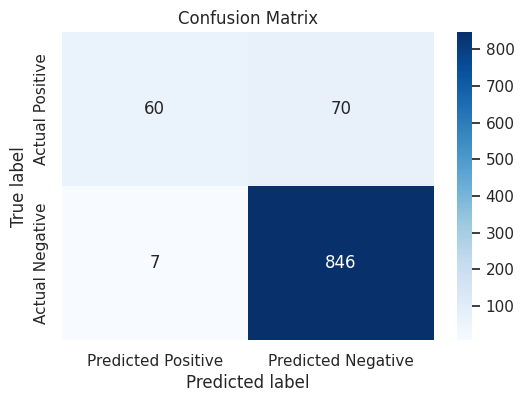

In [ ]:
confusion_matrix = np.array([[60, 70],
                            [7, 846]])
# Create a heatmap using seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Predicted Positive", "Predicted Negative"],
            yticklabels=["Actual Positive", "Actual Negative"])

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print(metrics.classification_report(y_train,Y_predSVC, digits=3))

              precision    recall  f1-score   support

         0.0      0.896     0.462     0.609       130
         1.0      0.924     0.992     0.956       853

    accuracy                          0.922       983
   macro avg      0.910     0.727     0.783       983
weighted avg      0.920     0.922     0.911       983



## **KNN Algorithm**

> creating KNN ML Model but to know which K to use I checked k between range 1 till 40 calculating errors with each k (in a loop )and I found that k=10 is the lowest error as we can see in the plot so I used it to create the last KNN model



<ipython-input-118-9ea61301a3e8>:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



Minimum error:- 0.11788617886178862 at K = 10


<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

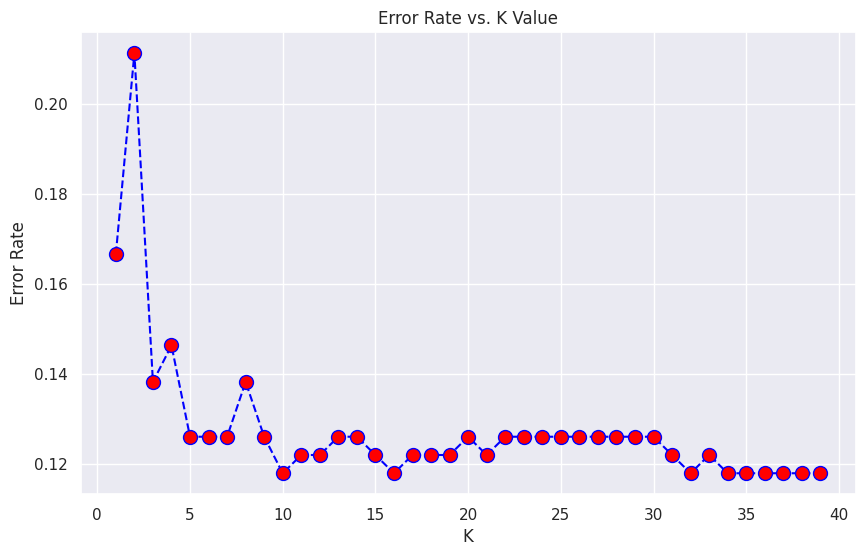

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
error_rate = []
for i in range(1,40):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(pcaxtrain,y_train)
 pred_i = knn.predict(pcaxtest)
 error_rate.append(np.mean(pred_i != y_test))
 plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
req_k_value = error_rate.index(min(error_rate))+1
print("Minimum error:-",min(error_rate),"at K =",req_k_value)

In [ ]:
from sklearn.metrics import confusion_matrix
#Fitting K-NN classifier to the training set
classifierknn= KNeighborsClassifier(n_neighbors=10, metric='minkowski', p=2 )
classifierknn.fit(pcaxtrain, y_train)
y_predtr= classifierknn.predict(pcaxtrain)
acc_knn=round(classifierknn.score(pcaxtrain, y_train) * 100, 2)
acc_knn1=round(classifierknn.score(pcaxtest, y_test) * 100, 2)
print('accuracy of knn train' , acc_knn)
print('accuracy of knn test' , acc_knn)
print(confusion_matrix(y_train, y_predtr))

accuracy of knn train 92.17
accuracy of knn test 92.17
[[ 64  66]
 [ 11 842]]


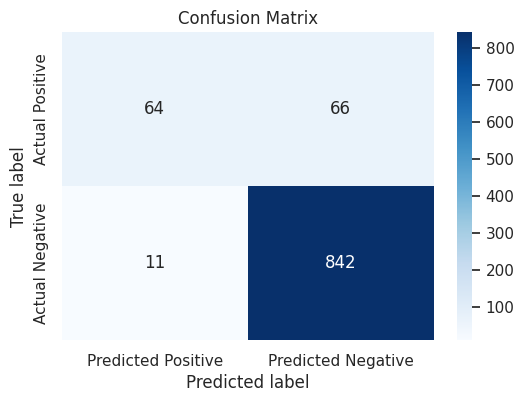

In [ ]:
confusion_matrix = np.array([[64, 66],
                            [11, 842]])
# Create a heatmap using seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Predicted Positive", "Predicted Negative"],
            yticklabels=["Actual Positive", "Actual Negative"])

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print(metrics.classification_report(y_train, y_predtr, digits=3))

              precision    recall  f1-score   support

         0.0      0.853     0.492     0.624       130
         1.0      0.927     0.987     0.956       853

    accuracy                          0.922       983
   macro avg      0.890     0.740     0.790       983
weighted avg      0.918     0.922     0.912       983



## **Gradient Boosting Algorithm**

> GradientBoosting classifier ML Model with n_estimators=500 (I tried lower values but it gave lower accuracy )


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
gbc=GradientBoostingClassifier(n_estimators=500,learning_rate=0.05,random_state=100,max_features=5 )
gbc.fit(pcaxtrain,y_train)
Y_predgbc = gbc.predict(pcaxtrain)
Y_predgbctest = gbc.predict(pcaxtest)
gbc_acc1 = round(gbc.score(pcaxtrain, y_train) * 100, 2)
gbc_acc2= round(gbc.score(pcaxtest, y_test) * 100, 2)

print("gradient boosting training set accuracy ", gbc_acc1)
print("gradient boosting testing  set accuracy ", gbc_acc2)

gradient boosting training set accuracy  99.9
gradient boosting testing  set accuracy  87.4


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_train, Y_predgbc)

array([[129,   1],
       [  0, 853]])

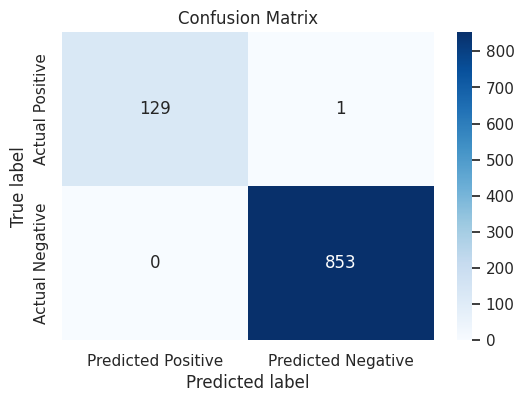

In [ ]:
confusion_matrix = np.array([[129, 1],
                            [0, 853]])
# Create a heatmap using seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Predicted Positive", "Predicted Negative"],
            yticklabels=["Actual Positive", "Actual Negative"])

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
print(metrics.classification_report(y_train, Y_predgbc, digits=3))

              precision    recall  f1-score   support

         0.0      1.000     0.992     0.996       130
         1.0      0.999     1.000     0.999       853

    accuracy                          0.999       983
   macro avg      0.999     0.996     0.998       983
weighted avg      0.999     0.999     0.999       983



# **AUC ROC Curve**
creating ROC curve for the Random forest model which we found it accurate 100 % ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classification model at all classification thresholds. This curve plots two parameters:

True Positive Rate False Positive Rate

and we can see the area under the curve AUC

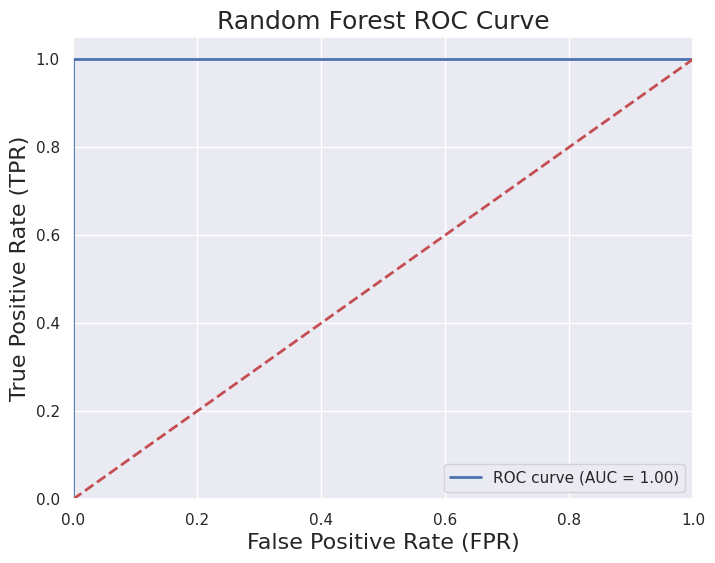

In [ ]:
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities of the positive class (class 1) from the trained model
y_scores = random_forest.predict_proba(pcaxtrain)[:, 1]

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Random Forest ROC Curve', fontsize=18)
plt.legend(loc='lower right')
plt.show()



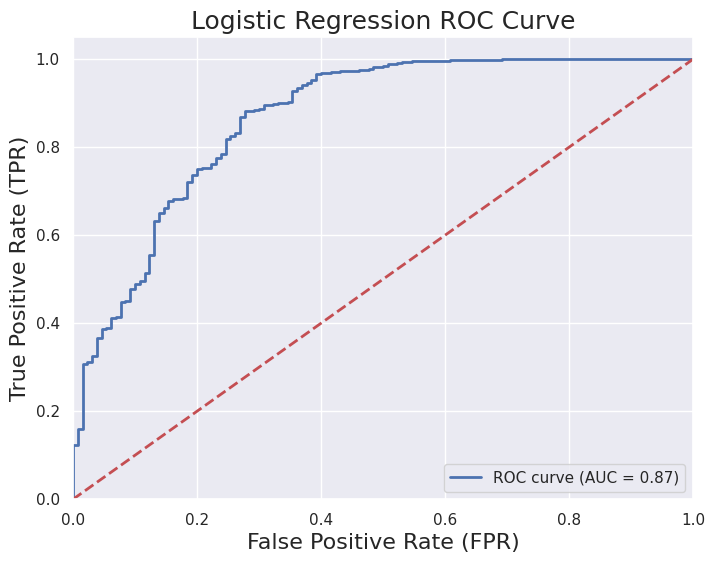

In [ ]:
# Get predicted probabilities from the trained model
y_scores = classifier2.decision_function(pcaxtrain)

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Logistic Regression ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()


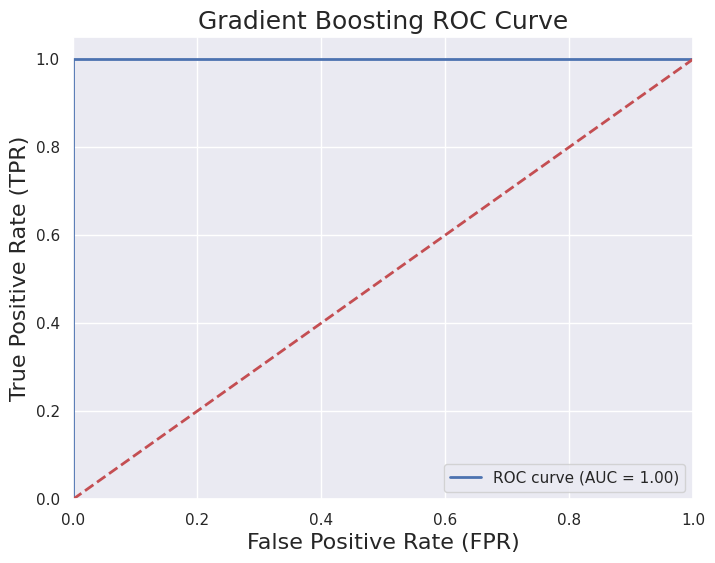

In [ ]:
# Get predicted probabilities from the trained model
y_scores = gbc.decision_function(pcaxtrain)

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Gradient Boosting ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()


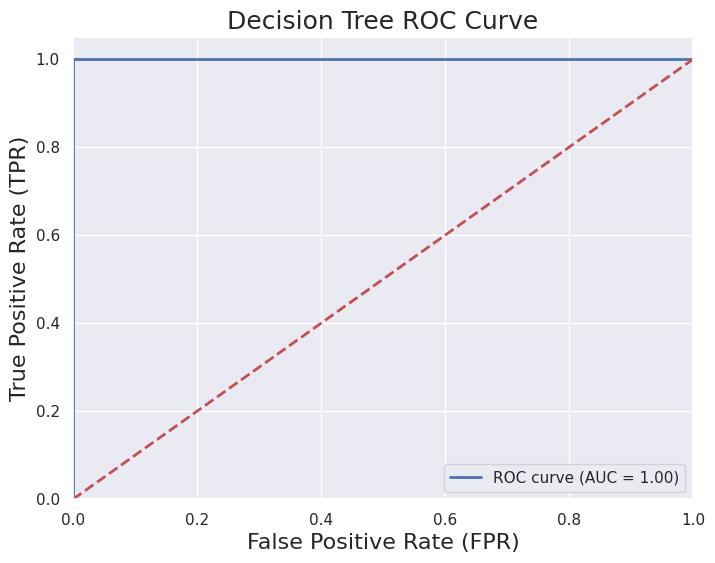

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier
# Get predicted probabilities of the positive class (class 1) from the trained model
y_scores = decisiontree.predict_proba(pcaxtrain)[:, 1]

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Decision Tree ROC Curve', fontsize=18)
plt.legend(loc='lower right')
plt.show()



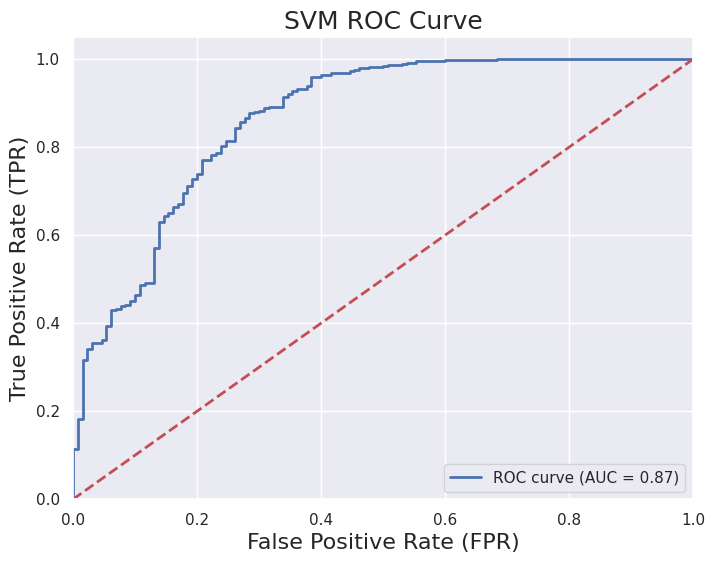

In [ ]:
from sklearn.metrics import roc_curve, auc
# Get predicted probabilities from the trained model
y_scores = svc.decision_function(pcaxtrain)

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('SVM ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()


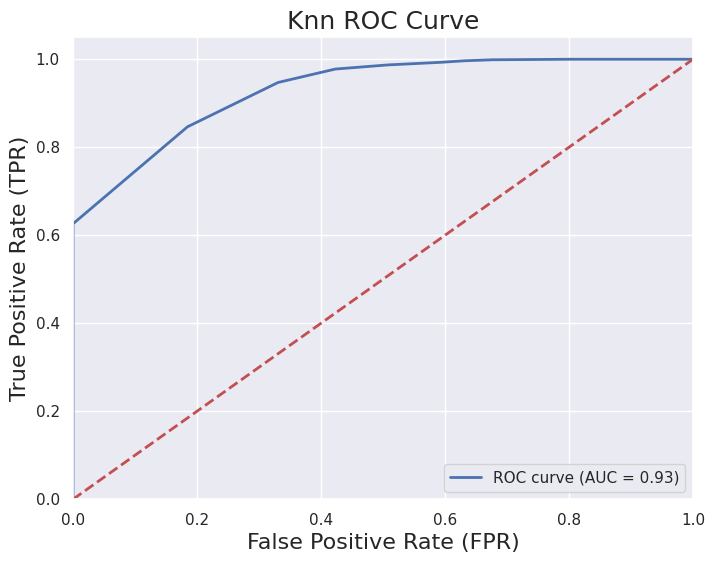

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
# Get predicted probabilities of the positive class (class 1) from the trained model
y_scores = classifierknn.predict_proba(pcaxtrain)[:, 1]

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Knn ROC Curve', fontsize=18)
plt.legend(loc='lower right')
plt.show()



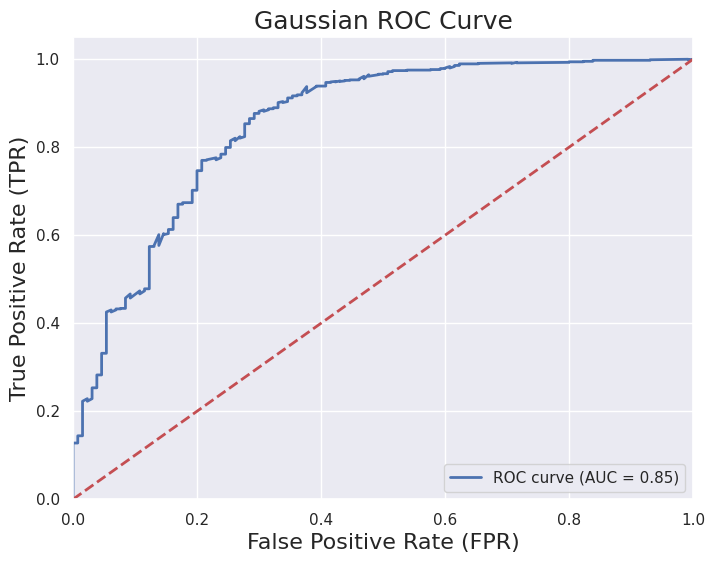

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get predicted probabilities from the trained model
y_probabilities = gaussian.predict_proba(pcaxtrain)[:, 1]  # Probabilities of the positive class

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_probabilities, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Sort the arrays for correct AUC calculation
sorted_indices = false_positive_rate.argsort()
false_positive_rate = false_positive_rate[sorted_indices]
true_positive_rate = true_positive_rate[sorted_indices]

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Gaussian ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()

# **Results**
 creating a comparsion Table between the seven models where we see that the Random forest is the best

note : test score for LR,Linearsvc ,knn and gaussiannb forced to zeros because I did not consider in the previous calculation

In [ ]:
results = pd.DataFrame({
    'Model': [ 'Logistic Regression',
              'Random Forest',
              'gaussian',
              'Decision Tree',
              'LinearSVC',
               'K-NN',
               'GradientBoost'
              ],
    'Score': [ acc_LR, acc_random_forest, acc_gaussian, acc_dt1 ,acc_svc ,acc_knn ,gbc_acc1 ],
    'Test_score': [acc_LR2,acc_random_forestts,acc_gaussian1,acc_dt2,acc_svc1,acc_knn1,gbc_acc2]})
result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Model')
result_df.head(9)

,Score,Test_score
Model,,
Random Forest,100.00,88.21
Decision Tree,100.00,82.52
GradientBoost,99.90,87.40
Logistic Regression,92.17,85.77
LinearSVC,92.17,85.77
K-NN,92.17,88.21
gaussian,89.83,86.59


# Prediction on Enrolled Dataset

## Using the Random Forest ML Model
to predict real enrolled students future state from the enrolled_NOW dataset
we see two classes predicted added to the dataset as new column called enrolled_NOW ['predicted_Target'])

and then we convert the classes from numerical values into 'Graduate' and 'Dropout' values in a new column called enrolled_NOW['target_text']

In [ ]:
Y_predictiont_true = random_forest.predict(X_enrolled_pca)
enrolled_NOW ['predicted_Target']=Y_predictiont_true
enrolled_NOW['predicted_Target'].unique()

array([1., 0.])

In [ ]:
enrolled_NOW.head(10)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,predicted_Target
0,0.0,0.5000,0.000,0.5625,1.0,0.000000,0.0,0.444444,0.900000,0.161290,...,0.352941,0.500000,0.166667,0.625000,0.000,0.372093,0.488889,0.766182,0.0,1.0
1,0.0,0.0000,0.000,0.9375,1.0,0.000000,0.0,0.444444,0.433333,0.225806,...,0.411765,0.285714,0.500000,0.767045,0.000,1.000000,0.244444,0.414795,0.0,1.0
2,0.0,0.5000,0.375,0.7500,1.0,0.000000,0.0,0.000000,0.900000,0.129032,...,0.470588,0.321429,0.666667,0.649148,0.000,0.593023,1.000000,0.311757,0.0,1.0
3,0.0,0.0000,0.000,0.5625,1.0,0.000000,0.0,0.444444,0.900000,0.290323,...,0.352941,0.428571,0.333333,0.625000,0.000,0.000000,0.755556,0.578600,0.0,1.0
4,0.0,0.0000,0.000,0.3125,1.0,0.000000,0.0,0.444444,0.433333,0.096774,...,0.294118,0.250000,0.333333,0.738636,0.000,0.209302,0.000000,0.124174,0.0,1.0
5,0.0,0.4375,0.125,0.6875,1.0,0.000000,0.0,0.074074,0.066667,0.032258,...,0.411765,0.250000,0.500000,0.779356,0.000,1.000000,0.244444,0.414795,0.0,1.0
6,0.0,0.8750,0.000,0.1875,1.0,0.866667,0.0,0.111111,0.133333,0.129032,...,0.352941,0.607143,0.416667,0.600649,0.000,1.000000,0.244444,0.414795,0.0,1.0
7,0.0,0.0000,0.000,0.5000,1.0,0.000000,0.0,0.000000,0.000000,0.129032,...,0.294118,0.285714,0.166667,0.767045,0.000,0.151163,0.488889,1.000000,0.0,1.0
8,0.0,0.4375,0.000,1.0000,0.0,0.000000,0.0,0.814815,0.900000,0.129032,...,0.294118,0.392857,0.250000,0.814394,0.125,0.000000,0.755556,0.578600,0.0,1.0
9,0.0,0.0000,0.000,0.6875,1.0,0.000000,0.0,0.777778,0.900000,0.193548,...,0.470588,0.357143,0.500000,0.672348,0.000,0.209302,0.000000,0.124174,0.0,1.0


In [ ]:
enrolled_NOW.loc[enrolled_NOW['predicted_Target']==0 ,'target_text']='Dropout'
enrolled_NOW.loc[enrolled_NOW['predicted_Target']==1 ,'target_text']='Graduate'
enrolled_NOW.head(50)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,predicted_Target,target_text
0,0.0,0.5000,0.000,0.5625,1.0,0.000000,0.000000,0.444444,0.900000,0.161290,...,0.500000,0.166667,0.625000,0.000,0.372093,0.488889,0.766182,0.0,1.0,Graduate
1,0.0,0.0000,0.000,0.9375,1.0,0.000000,0.000000,0.444444,0.433333,0.225806,...,0.285714,0.500000,0.767045,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
2,0.0,0.5000,0.375,0.7500,1.0,0.000000,0.000000,0.000000,0.900000,0.129032,...,0.321429,0.666667,0.649148,0.000,0.593023,1.000000,0.311757,0.0,1.0,Graduate
3,0.0,0.0000,0.000,0.5625,1.0,0.000000,0.000000,0.444444,0.900000,0.290323,...,0.428571,0.333333,0.625000,0.000,0.000000,0.755556,0.578600,0.0,1.0,Graduate
4,0.0,0.0000,0.000,0.3125,1.0,0.000000,0.000000,0.444444,0.433333,0.096774,...,0.250000,0.333333,0.738636,0.000,0.209302,0.000000,0.124174,0.0,1.0,Graduate
5,0.0,0.4375,0.125,0.6875,1.0,0.000000,0.000000,0.074074,0.066667,0.032258,...,0.250000,0.500000,0.779356,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
6,0.0,0.8750,0.000,0.1875,1.0,0.866667,0.000000,0.111111,0.133333,0.129032,...,0.607143,0.416667,0.600649,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
7,0.0,0.0000,0.000,0.5000,1.0,0.000000,0.000000,0.000000,0.000000,0.129032,...,0.285714,0.166667,0.767045,0.000,0.151163,0.488889,1.000000,0.0,1.0,Graduate
8,0.0,0.4375,0.000,1.0000,0.0,0.000000,0.000000,0.814815,0.900000,0.129032,...,0.392857,0.250000,0.814394,0.125,0.000000,0.755556,0.578600,0.0,1.0,Graduate
9,0.0,0.0000,0.000,0.6875,1.0,0.000000,0.000000,0.777778,0.900000,0.193548,...,0.357143,0.500000,0.672348,0.000,0.209302,0.000000,0.124174,0.0,1.0,Graduate


### Applying KNN algorithm on Enrolled Now

In [ ]:
Y_predictiont_true = classifierknn.predict(X_enrolled_pca)
enrolled_NOW ['predicted_Target']=Y_predictiont_true
enrolled_NOW['predicted_Target'].unique()

array([1., 0.])

In [ ]:
enrolled_NOW.head(10)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,predicted_Target
0,0.0,0.5000,0.000,0.5625,1.0,0.000000,0.0,0.444444,0.900000,0.161290,...,0.352941,0.500000,0.166667,0.625000,0.000,0.372093,0.488889,0.766182,0.0,1.0
1,0.0,0.0000,0.000,0.9375,1.0,0.000000,0.0,0.444444,0.433333,0.225806,...,0.411765,0.285714,0.500000,0.767045,0.000,1.000000,0.244444,0.414795,0.0,1.0
2,0.0,0.5000,0.375,0.7500,1.0,0.000000,0.0,0.000000,0.900000,0.129032,...,0.470588,0.321429,0.666667,0.649148,0.000,0.593023,1.000000,0.311757,0.0,1.0
3,0.0,0.0000,0.000,0.5625,1.0,0.000000,0.0,0.444444,0.900000,0.290323,...,0.352941,0.428571,0.333333,0.625000,0.000,0.000000,0.755556,0.578600,0.0,1.0
4,0.0,0.0000,0.000,0.3125,1.0,0.000000,0.0,0.444444,0.433333,0.096774,...,0.294118,0.250000,0.333333,0.738636,0.000,0.209302,0.000000,0.124174,0.0,1.0
5,0.0,0.4375,0.125,0.6875,1.0,0.000000,0.0,0.074074,0.066667,0.032258,...,0.411765,0.250000,0.500000,0.779356,0.000,1.000000,0.244444,0.414795,0.0,1.0
6,0.0,0.8750,0.000,0.1875,1.0,0.866667,0.0,0.111111,0.133333,0.129032,...,0.352941,0.607143,0.416667,0.600649,0.000,1.000000,0.244444,0.414795,0.0,1.0
7,0.0,0.0000,0.000,0.5000,1.0,0.000000,0.0,0.000000,0.000000,0.129032,...,0.294118,0.285714,0.166667,0.767045,0.000,0.151163,0.488889,1.000000,0.0,1.0
8,0.0,0.4375,0.000,1.0000,0.0,0.000000,0.0,0.814815,0.900000,0.129032,...,0.294118,0.392857,0.250000,0.814394,0.125,0.000000,0.755556,0.578600,0.0,1.0
9,0.0,0.0000,0.000,0.6875,1.0,0.000000,0.0,0.777778,0.900000,0.193548,...,0.470588,0.357143,0.500000,0.672348,0.000,0.209302,0.000000,0.124174,0.0,1.0


In [ ]:
enrolled_NOW.loc[enrolled_NOW['predicted_Target']==0 ,'target_text']='Dropout'
enrolled_NOW.loc[enrolled_NOW['predicted_Target']==1 ,'target_text']='Graduate'
enrolled_NOW.head(50)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,predicted_Target,target_text
0,0.0,0.5000,0.000,0.5625,1.0,0.000000,0.000000,0.444444,0.900000,0.161290,...,0.500000,0.166667,0.625000,0.000,0.372093,0.488889,0.766182,0.0,1.0,Graduate
1,0.0,0.0000,0.000,0.9375,1.0,0.000000,0.000000,0.444444,0.433333,0.225806,...,0.285714,0.500000,0.767045,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
2,0.0,0.5000,0.375,0.7500,1.0,0.000000,0.000000,0.000000,0.900000,0.129032,...,0.321429,0.666667,0.649148,0.000,0.593023,1.000000,0.311757,0.0,1.0,Graduate
3,0.0,0.0000,0.000,0.5625,1.0,0.000000,0.000000,0.444444,0.900000,0.290323,...,0.428571,0.333333,0.625000,0.000,0.000000,0.755556,0.578600,0.0,1.0,Graduate
4,0.0,0.0000,0.000,0.3125,1.0,0.000000,0.000000,0.444444,0.433333,0.096774,...,0.250000,0.333333,0.738636,0.000,0.209302,0.000000,0.124174,0.0,1.0,Graduate
5,0.0,0.4375,0.125,0.6875,1.0,0.000000,0.000000,0.074074,0.066667,0.032258,...,0.250000,0.500000,0.779356,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
6,0.0,0.8750,0.000,0.1875,1.0,0.866667,0.000000,0.111111,0.133333,0.129032,...,0.607143,0.416667,0.600649,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
7,0.0,0.0000,0.000,0.5000,1.0,0.000000,0.000000,0.000000,0.000000,0.129032,...,0.285714,0.166667,0.767045,0.000,0.151163,0.488889,1.000000,0.0,1.0,Graduate
8,0.0,0.4375,0.000,1.0000,0.0,0.000000,0.000000,0.814815,0.900000,0.129032,...,0.392857,0.250000,0.814394,0.125,0.000000,0.755556,0.578600,0.0,1.0,Graduate
9,0.0,0.0000,0.000,0.6875,1.0,0.000000,0.000000,0.777778,0.900000,0.193548,...,0.357143,0.500000,0.672348,0.000,0.209302,0.000000,0.124174,0.0,1.0,Graduate


### Applying Guessian Algorithm on the Enrolled Now

In [ ]:
Y_predictiont_true = gbc.predict(X_enrolled_pca)
enrolled_NOW ['predicted_Target']=Y_predictiont_true
enrolled_NOW['predicted_Target'].unique()

array([1., 0.])

In [ ]:
enrolled_NOW.loc[enrolled_NOW['predicted_Target']==0 ,'target_text']='Dropout'
enrolled_NOW.loc[enrolled_NOW['predicted_Target']==1 ,'target_text']='Graduate'
enrolled_NOW.head(50)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,predicted_Target,target_text
0,0.0,0.5000,0.000,0.5625,1.0,0.000000,0.000000,0.444444,0.900000,0.161290,...,0.500000,0.166667,0.625000,0.000,0.372093,0.488889,0.766182,0.0,1.0,Graduate
1,0.0,0.0000,0.000,0.9375,1.0,0.000000,0.000000,0.444444,0.433333,0.225806,...,0.285714,0.500000,0.767045,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
2,0.0,0.5000,0.375,0.7500,1.0,0.000000,0.000000,0.000000,0.900000,0.129032,...,0.321429,0.666667,0.649148,0.000,0.593023,1.000000,0.311757,0.0,1.0,Graduate
3,0.0,0.0000,0.000,0.5625,1.0,0.000000,0.000000,0.444444,0.900000,0.290323,...,0.428571,0.333333,0.625000,0.000,0.000000,0.755556,0.578600,0.0,1.0,Graduate
4,0.0,0.0000,0.000,0.3125,1.0,0.000000,0.000000,0.444444,0.433333,0.096774,...,0.250000,0.333333,0.738636,0.000,0.209302,0.000000,0.124174,0.0,1.0,Graduate
5,0.0,0.4375,0.125,0.6875,1.0,0.000000,0.000000,0.074074,0.066667,0.032258,...,0.250000,0.500000,0.779356,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
6,0.0,0.8750,0.000,0.1875,1.0,0.866667,0.000000,0.111111,0.133333,0.129032,...,0.607143,0.416667,0.600649,0.000,1.000000,0.244444,0.414795,0.0,1.0,Graduate
7,0.0,0.0000,0.000,0.5000,1.0,0.000000,0.000000,0.000000,0.000000,0.129032,...,0.285714,0.166667,0.767045,0.000,0.151163,0.488889,1.000000,0.0,1.0,Graduate
8,0.0,0.4375,0.000,1.0000,0.0,0.000000,0.000000,0.814815,0.900000,0.129032,...,0.392857,0.250000,0.814394,0.125,0.000000,0.755556,0.578600,0.0,1.0,Graduate
9,0.0,0.0000,0.000,0.6875,1.0,0.000000,0.000000,0.777778,0.900000,0.193548,...,0.357143,0.500000,0.672348,0.000,0.209302,0.000000,0.124174,0.0,1.0,Graduate


# Working only the high correlated feature

[Text(0, 0, 'Curricular units 2nd sem (approved)'),
 Text(1, 0, 'Curricular units 2nd sem (grade)'),
 Text(2, 0, 'Curricular units 1st sem (approved)'),
 Text(3, 0, 'Curricular units 1st sem (grade)'),
 Text(4, 0, 'Tuition fees up to date'),
 Text(5, 0, 'Scholarship holder')]

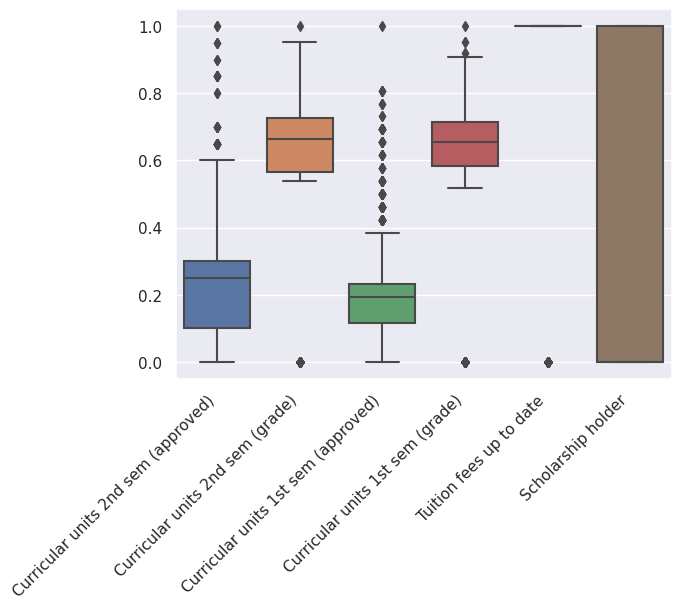

In [ ]:
g = sns.boxplot(df[['Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Tuition fees up to date', 'Scholarship holder']])
# Increase the spacing between the x-axis labels
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha="right")

Marital status                                    0.000000
Application mode                                  0.647059
Application order                                 0.166667
Course                                            0.437500
Daytime/evening attendance                        0.000000
Previous qualification                            0.000000
Nacionality                                       0.000000
Mother's qualification                            0.714286
Father's qualification                            0.727273
Mother's occupation                               0.161290
Father's occupation                               0.111111
Displaced                                         1.000000
Educational special needs                         0.000000
Debtor                                            0.000000
Tuition fees up to date                           0.000000
Gender                                            1.000000
Scholarship holder                                1.0000

<ipython-input-45-4640792a9ef0>:5: FutureWarning:

Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`

<ipython-input-45-4640792a9ef0>:5: FutureWarning:

Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`



[Text(0, 0, 'Curricular units 2nd sem (approved)'),
 Text(1, 0, 'Curricular units 2nd sem (grade)'),
 Text(2, 0, 'Curricular units 1st sem (approved)'),
 Text(3, 0, 'Curricular units 1st sem (grade)'),
 Text(4, 0, 'Tuition fees up to date'),
 Text(5, 0, 'Scholarship holder')]

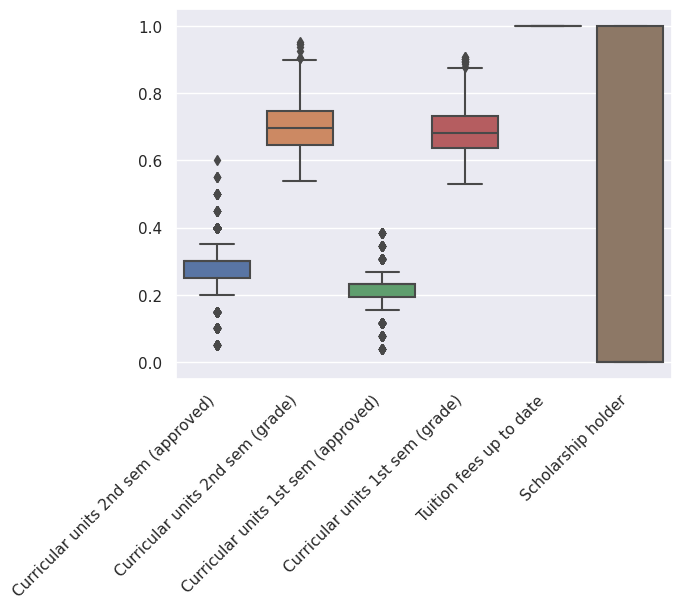

In [ ]:
q1=df.quantile(0.25)
q3=df.quantile(0.75)
iqr=q3-q1
print(iqr)
df = df[['Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Tuition fees up to date', 'Scholarship holder']][~((df[['Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Tuition fees up to date', 'Scholarship holder']] < (q1 - 1.5 * iqr)) |(df[['Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Tuition fees up to date', 'Scholarship holder']] > (q3 + 1.5 * iqr))).any(axis=1)]
g =sns.boxplot(data=df[['Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Tuition fees up to date', 'Scholarship holder']])
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha="right")

In [ ]:
df.shape

(2425, 6)

## Splitting the Data

In [ ]:
X_features=df.values[:,0:4]
y_label= df.values[:,5]
#Split the data into 80/20
X_train,X_test,y_train,y_test=train_test_split(X_features,y_label,test_size=0.2,random_state=0)

## Robust Scaler

In [ ]:
from sklearn.preprocessing import RobustScaler
rob_scaler = RobustScaler()
X_train = rob_scaler.fit_transform(X_train)
X_test = rob_scaler.fit_transform(X_test)
X_enrolled_NOW=rob_scaler.fit_transform(enrolled_NOW.values[:,0:33])

## PCA

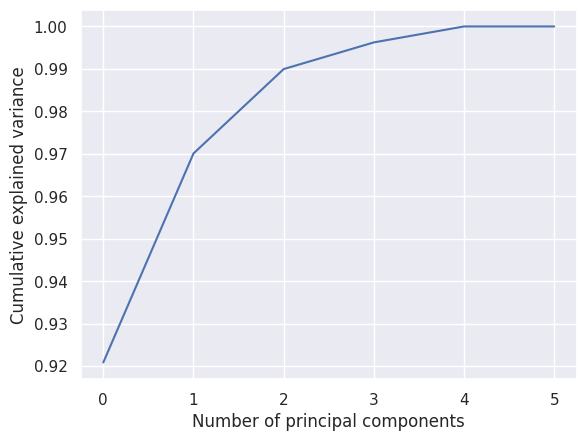

In [ ]:
from sklearn.decomposition import PCA
# Assuming your data contains only numerical features (exclude non-numeric columns if any)
data = df.select_dtypes(include=[np.number])

# Create a PCA model
pca = PCA()
pca.fit(data)

# Calculate the cumulative explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Create a plot
plt.plot(explained_variance)
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.show()

In [ ]:
#apply pca
pca=PCA(n_components=4)
pcaxtrain=pca.fit_transform(X_train)
pcaxtest=pca.fit_transform(X_test)
X_enrolled_pca=pca.fit_transform(X_enrolled_NOW)
pca.n_components

4

## **Random Forest**

In [ ]:
#hyperparameters n_estimator with 90,100 ,random_state starting with 0 to 100
from sklearn.ensemble import RandomForestClassifier
random_forest = RandomForestClassifier(n_estimators=100 ,random_state=0)
random_forest.fit(pcaxtrain, y_train)
Y_prediction = random_forest.predict(pcaxtrain )
print(random_forest.classes_)
acc_random_forest = round(random_forest.score(pcaxtrain, y_train) * 100, 2)
print('Accuracy using Training data',acc_random_forest)
Y_predictionts = random_forest.predict(pcaxtest )
acc_random_forestts = round(random_forest.score(pcaxtest, y_test) * 100, 2)
print('Accuracy using Testing data',acc_random_forestts)
print('Confusion matrix for training',confusion_matrix(y_train, Y_prediction))
print('Confusion matrix for training',confusion_matrix(y_test, Y_predictionts))


[0. 1.]
Accuracy using Training data 96.75
Accuracy using Testing data 64.54
Confusion matrix for training [[1239   22]
 [  41  638]]
Confusion matrix for training [[277  52]
 [120  36]]


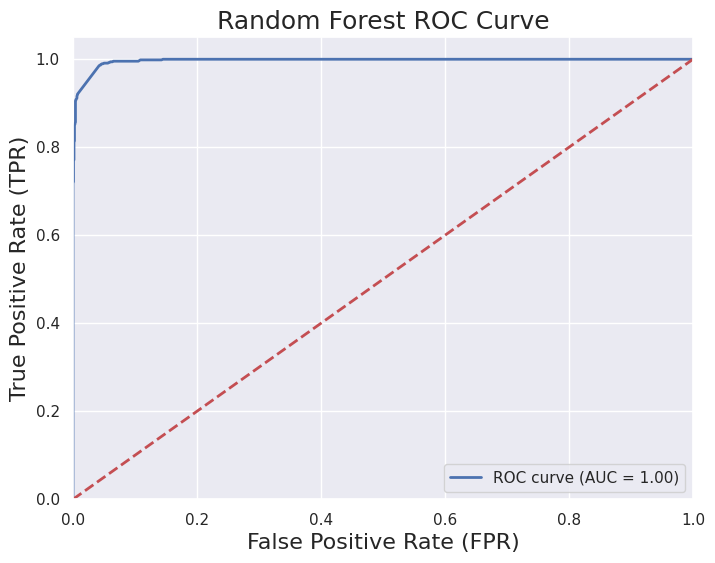

In [ ]:
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities of the positive class (class 1) from the trained model
y_scores = random_forest.predict_proba(pcaxtrain)[:, 1]

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Random Forest ROC Curve', fontsize=18)
plt.legend(loc='lower right')
plt.show()



## **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
classifier2 = LogisticRegression(random_state=0)
classifier2.fit(pcaxtrain, y_train)
print(classifier2.classes_)

predictTrain = classifier2.predict(pcaxtrain)
predict = classifier2.predict(pcaxtest)

acc_LR= round(classifier2.score(pcaxtrain, y_train) * 100, 2)
print('Accuracy using Training data',acc_LR)
acc_LR2 = round(classifier2.score(pcaxtest, y_test) * 100, 2)
print('Accuracy using Testing data',acc_LR2)

cm_train = confusion_matrix(y_train, predictTrain)
print("Confusion Matrix - Training Set:")
print(cm_train)

cm_test = confusion_matrix(y_test, predict)
print("Confusion Matrix - Test Set:")
print(cm_test)

[0. 1.]
Accuracy using Training data 63.61
Accuracy using Testing data 66.6
Confusion Matrix - Training Set:
[[1219   42]
 [ 664   15]]
Confusion Matrix - Test Set:
[[322   7]
 [155   1]]


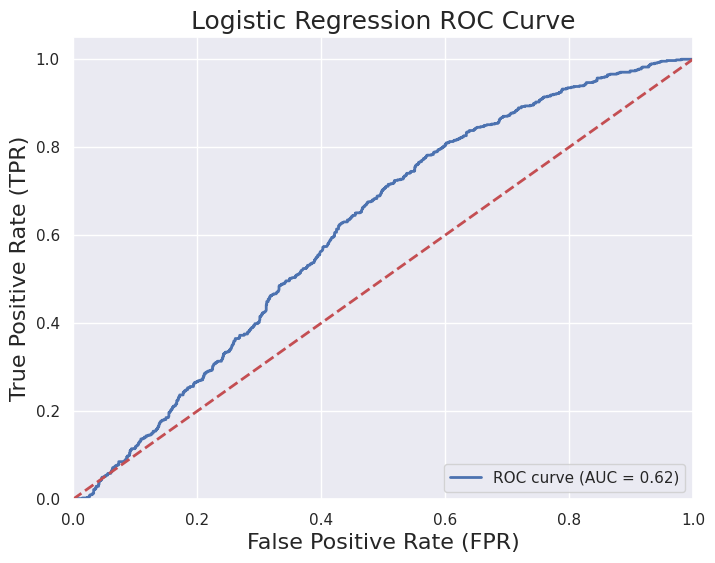

In [ ]:
# Get predicted probabilities from the trained model
y_scores = classifier2.decision_function(pcaxtrain)

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Logistic Regression ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()

## **Decision Tree**

In [ ]:
decisiontree=DecisionTreeClassifier()
decisiontree.fit(pcaxtrain,y_train)
Y_predDT=decisiontree.predict(pcaxtrain)
acc_dt1=round(decisiontree.score(pcaxtrain, y_train) * 100, 2)
Y_predDT2=decisiontree.predict(pcaxtest)
acc_dt2=round(decisiontree.score(pcaxtest, y_test) * 100, 2)
print('Accuracy using Training data',acc_dt1)
print('Accuracy using Testing data',acc_dt2)
print("Confusion Matrix - Training Set:")
confusion_matrix(y_train, Y_predDT)
print("Confusion Matrix - Test Set:")
confusion_matrix(y_test, Y_predDT2)

Accuracy using Training data 96.75
Accuracy using Testing data 52.99
Confusion Matrix - Training Set:
Confusion Matrix - Test Set:


array([[179, 150],
       [ 78,  78]])

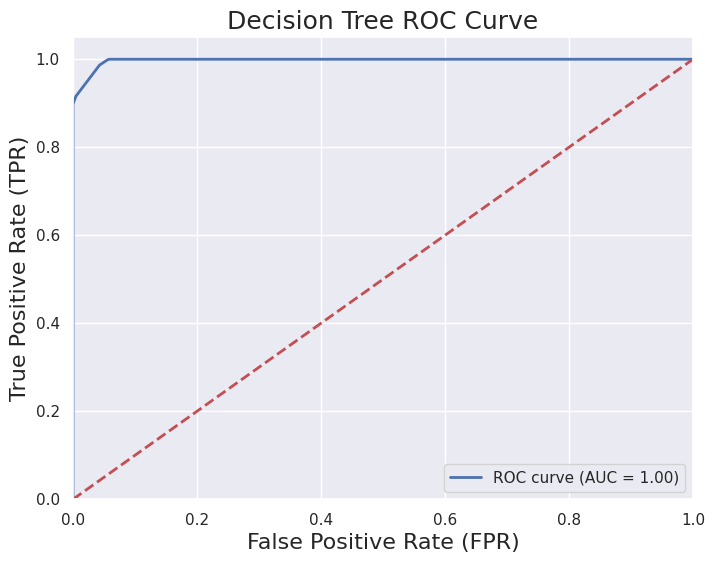

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier
# Get predicted probabilities of the positive class (class 1) from the trained model
y_scores = decisiontree.predict_proba(pcaxtrain)[:, 1]

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Decision Tree ROC Curve', fontsize=18)
plt.legend(loc='lower right')
plt.show()



## **SVC Algorithm**

In [ ]:
svc=LinearSVC(dual=False , max_iter=10000)
svc.fit(pcaxtrain,y_train)
Y_predSVC=svc.predict(pcaxtrain)
acc_svc=round(svc.score(pcaxtrain, y_train) * 100, 2)
acc_svc1=round(svc.score(pcaxtest, y_test) * 100, 2)
print('Accuracy train',acc_svc)
print('Accuracy test',acc_svc1)
print("Confusion Matrix - Training Set:")
confusion_matrix(y_train, Y_predSVC)

Accuracy train 63.87
Accuracy test 66.8
Confusion Matrix - Training Set:


array([[1237,   24],
       [ 677,    2]])

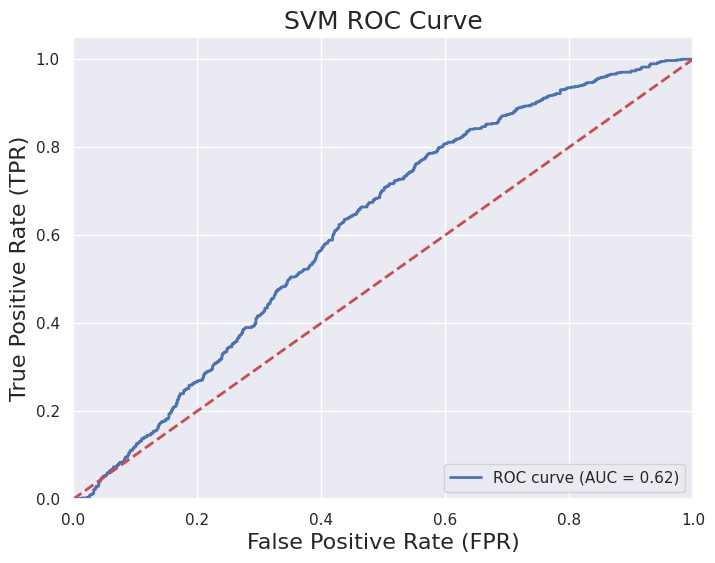

In [ ]:
from sklearn.metrics import roc_curve, auc
# Get predicted probabilities from the trained model
y_scores = svc.decision_function(pcaxtrain)

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('SVM ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()

## **KNN Classifier**

<ipython-input-71-9ea61301a3e8>:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



Minimum error:- 0.354639175257732 at K = 28


<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

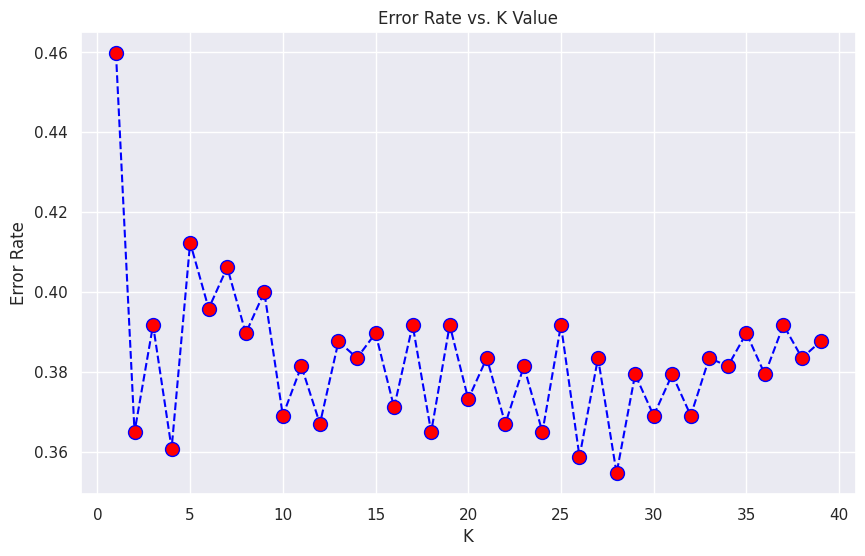

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
error_rate = []
for i in range(1,40):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(pcaxtrain,y_train)
 pred_i = knn.predict(pcaxtest)
 error_rate.append(np.mean(pred_i != y_test))
 plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
req_k_value = error_rate.index(min(error_rate))+1
print("Minimum error:-",min(error_rate),"at K =",req_k_value)

In [ ]:
from sklearn.metrics import confusion_matrix
#Fitting K-NN classifier to the training set
classifierknn= KNeighborsClassifier(n_neighbors=25, metric='minkowski', p=2 )
classifierknn.fit(pcaxtrain, y_train)
y_predtr= classifierknn.predict(pcaxtrain)
acc_knn=round(classifierknn.score(pcaxtrain, y_train) * 100, 2)
acc_knn1=round(classifierknn.score(pcaxtest, y_test) * 100, 2)
print('accuracy of knn train' , acc_knn)
print('accuracy of knn test' , acc_knn)

accuracy of knn train 67.42
accuracy of knn test 67.42


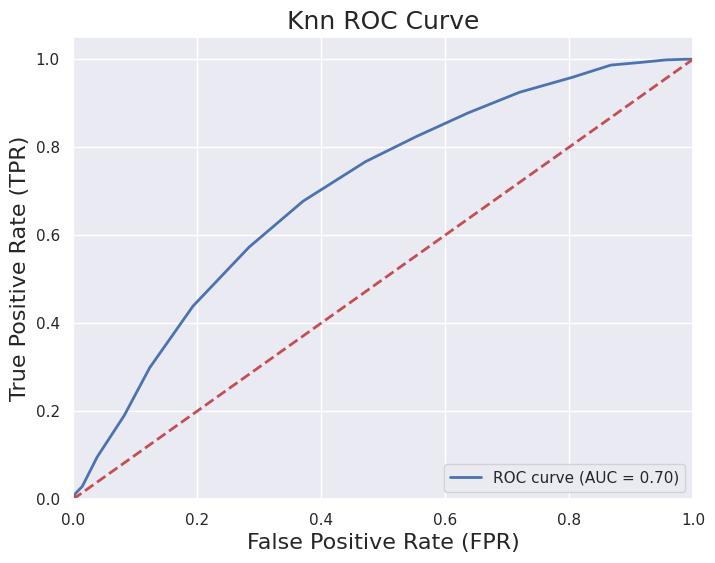

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
# Get predicted probabilities of the positive class (class 1) from the trained model
y_scores = classifierknn.predict_proba(pcaxtrain)[:, 1]

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Knn ROC Curve', fontsize=18)
plt.legend(loc='lower right')
plt.show()

## **Gradient Bosting**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
gbc=GradientBoostingClassifier(n_estimators=500,learning_rate=0.05,random_state=100,max_features=5 )
gbc.fit(pcaxtrain,y_train)
Y_predgbc = gbc.predict(pcaxtrain)
Y_predgbctest = gbc.predict(pcaxtest)
gbc_acc1 = round(gbc.score(pcaxtrain, y_train) * 100, 2)
gbc_acc2= round(gbc.score(pcaxtest, y_test) * 100, 2)

print("gradient boosting training set accuracy ", gbc_acc1)
print("gradient boosting testing  set accuracy ", gbc_acc2)
print("Confusion Matrix - Training Set:")
confusion_matrix(y_train, Y_predgbc)

gradient boosting training set accuracy  81.65
gradient boosting testing  set accuracy  61.44
Confusion Matrix - Training Set:


array([[1193,   68],
       [ 288,  391]])

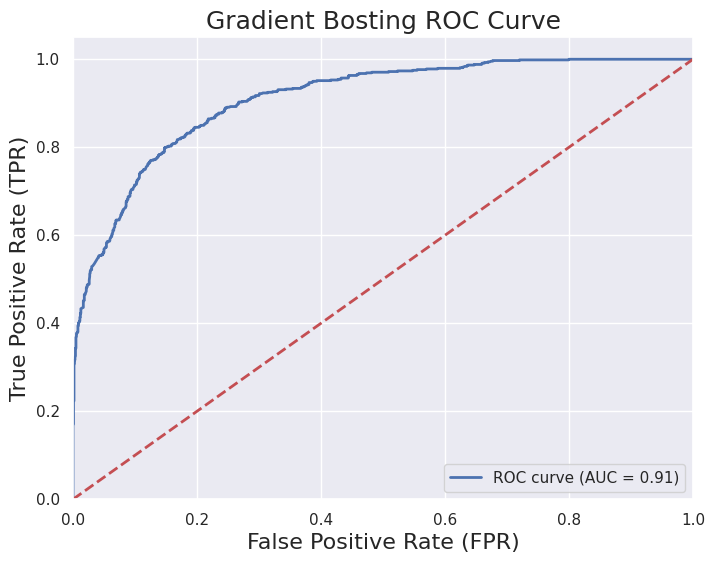

In [ ]:
# Get predicted probabilities from the trained model
y_scores = gbc.decision_function(pcaxtrain)

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_scores, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Gradient Bosting ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()


## **Guissian algorithm**

In [ ]:
gaussian = GaussianNB()
gaussian.fit(pcaxtrain, y_train)
Y_pred = gaussian.predict(pcaxtrain)
acc_gaussian = round(gaussian.score(pcaxtrain, y_train) * 100, 2)
acc_gaussian1 = round(gaussian.score(pcaxtest, y_test) * 100, 2)
print('Accuracy Train',acc_gaussian)
print('Accuracy Test',acc_gaussian1)

Accuracy Train 63.25
Accuracy Test 59.38


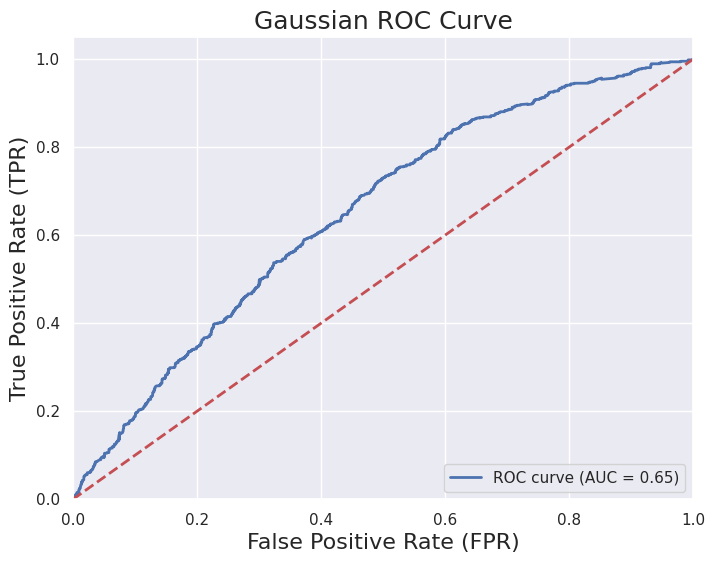

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get predicted probabilities from the trained model
y_probabilities = gaussian.predict_proba(pcaxtrain)[:, 1]  # Probabilities of the positive class

# Compute the ROC curve and AUC
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, y_probabilities, pos_label=1)
roc_auc = auc(false_positive_rate, true_positive_rate)

# Sort the arrays for correct AUC calculation
sorted_indices = false_positive_rate.argsort()
false_positive_rate = false_positive_rate[sorted_indices]
true_positive_rate = true_positive_rate[sorted_indices]

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(false_positive_rate, true_positive_rate, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2)  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=16)
plt.ylabel('True Positive Rate (TPR)', fontsize=16)
plt.title('Gaussian ROC Curve', fontsize=18)  # Corrected title
plt.legend(loc='lower right')
plt.show()


# **Results**

In [ ]:
results = pd.DataFrame({
    'Model': [ 'Logistic Regression',
              'Random Forest',
              'gaussian',
              'Decision Tree',
              'LinearSVC',
               'K-NN',
               'GradientBoost'
              ],
    'Score': [ acc_LR, acc_random_forest, acc_gaussian, acc_dt1 ,acc_svc ,acc_knn ,gbc_acc1 ],
    'Test_score': [acc_LR2,acc_random_forestts,acc_gaussian1,acc_dt2,acc_svc1,acc_knn1,gbc_acc2]})
result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Model')
result_df.head(9)

,Score,Test_score
Model,,
Random Forest,96.75,64.54
Decision Tree,96.75,52.99
GradientBoost,81.65,61.44
K-NN,67.42,60.82
LinearSVC,63.87,66.80
Logistic Regression,63.61,66.60
gaussian,63.25,59.38


**Done By: Rami Assaf**